<a href="https://colab.research.google.com/github/bamacgabhann/GY5021/blob/main/docs/3_Spatial_and_Temporal_Change/13_Spatial_Change-Moving_Features.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Spatial Change: Moving Features

In the two *Temporal Change* Notebooks, we used SAR imagery on different dates, and census data from different years, to look at how things change over time.

Change from one date or time to another isn't the only change we can map, though - we can also map and analyse features which are moving.

In this Notebook, we're going to use the example of transport geography to illustrate the power of looking at data for people and objects which aren't fixed in place.

In [1]:
if 'google.colab' in str(get_ipython()):
  !pip install osmnx movingpandas

import pandas as pd
import geopandas as gpd
from shapely import LineString
import movingpandas as mpd
import osmnx as ox
import numpy as np
import shapely as shp
import matplotlib.pyplot as plt
import matplotlib.colors as colors

from datetime import datetime, timedelta
from shapely.geometry import Point, LineString, Polygon, box

import warnings

warnings.filterwarnings("ignore")

pd.options.mode.copy_on_write = True # this line is just changing a setting to make this work more easily

/home/breandan/code/GY5021/.venv/lib/python3.14/site-packages/movingpandas/__init__.py:41: UserWarning: Missing optional dependencies. To use the trajectory smoother classes please install Stone Soup (see https://stonesoup.readthedocs.io/en/latest/#installation).
  warnings.warn(e.msg, UserWarning)


## 1. Moving people

We're actually going to start by sticking with census data. At the start of the last Notebook, I pointed out how the connection of census forms to particular addresses meant we could put census data on a map. But that home address is not the only location given for each person on the census form: there's also a question asking about everyone's Place of Work, School, or College. 

This means we have *two* locations for everyone, and can map how people are moving.

In [2]:
powscar_ed_2022 = pd.read_csv('https://www.cso.ie/en/media/csoie/census/documents/powsccar2022/Commuting_Data_EDtoED_2022.zip')
powscar_ed_2022.head()

,RESIDENCE_CSOED_GUID,RESIDENCE_CSOED_LABEL,RESIDENCE_COUNTY,RESIDENCE_COUNTY_LABEL,POWSCC_CSOED_GUID,POWSCC_CSOED_LABEL,POWSCC_COUNTY,POWSCC_COUNTY_LABEL,COUNT
0,06698531-f7f7-4058-a15f-7d455ef0dd94,KILLINAGH/TEEBANE,CN,Cavan,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,3
1,23519126-bd85-4c40-a1e2-26c5d2b7e51c,ARIGNA/DRUMKEERAN/KILLARGA,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,2
2,2ae19629-16fd-13a3-e055-000000000001,BARNAMEENAGH,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,2
3,2ae19629-170e-13a3-e055-000000000001,BELHAVEL,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,1
4,2ae19629-1714-13a3-e055-000000000001,DRUMREILLY NORTH,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,1


This is the data for 2016 at Electoral Division level (access to the data for smaller geographic areas is heavily restricted to researchers on approved projects for data protection reasons). Essentially, each row gives two locations - the 'RESIDENCE' electoral division, and the 'POWSCAR' electoral division - the place of work, school, or college. The last column is a count of how many people live in the specified residence ED, and commute to the specified POWSCAR ED. 

Mapping this is not straightforward, because each row has *two* locations. Each of those locations can individually be described by a vector polygon, but we can't have two different vector polygons for one row of attributes. 

However, there is a way to illustrate data which has two locations for each row - just not as polygons. If each location was a single coordinate, we'd have a start coordinate and an end coordinate. Two coordinates can be represented by a line. So, we can illustrate the data if we can create a line feature for each row.

To do this, all we need to do is represent each of the vector polygons by a single point - for example the centre point of the vector polygon, commonly called the centroid. 

For this we need to download and process the map of electoral division boundaries from the CSO.


In [3]:
ed_2022 = gpd.read_file('https://stg-arcgisazurecdataprodeu1.az.arcgis.com/exportfiles-3330-46/CSO_Electoral_Divisions_National_Statistical_Boundaries_2022_Ungeneralised_view_-1689144517402289515.gpkg?sv=2025-05-05&st=2026-08-24T20%3A45%3A44Z&se=2026-08-24T21%3A50%3A44Z&sr=b&sp=r&sig=ejf6UcWi%2FUIX3ura%2Fupm89Mev2Kar6Y8D0MI8NDSkwo%3D')
ed_2022.head()

,ED_GUID,ED_OFFICIAL,ED_ENGLISH,ED_GAEILGE,ED_ID_STR,ED_PART_COUNT,COUNTY_CODE,COUNTY_ENGLISH,COUNTY_GAEILGE,CSO_LEA,geometry
0,06698531-f7f7-4058-a15f-7d455ef0dd94,N,KILLINAGH/TEEBANE,CILL LAIGHNEACH/AN TAOBH BÁN,027058/027085,1,32,CAVAN,An Cabhán,CAVAN-BELTURBET,"MULTIPOLYGON (((605406.79 833829.67, 605387.02..."
1,21a09083-a130-47d2-8690-23338d5ecf18,N,CASTLETOWN (NORTH),CAISLEÁN DHÚN DEALGAN (THUAIDH),147008,1,10,LOUTH,Lú,DUNDALK-CARLINGFORD,"MULTIPOLYGON (((702464.746 810977.299, 702458...."
2,23519126-bd85-4c40-a1e2-26c5d2b7e51c,N,ARIGNA/DRUMKEERAN/KILLARGA,AN AIRGNIGH/DROIM CAORTHAINN/CILL FHEARGA,117029/117007/117054,1,28,LEITRIM,Liatroim,MANORHAMILTON,"MULTIPOLYGON (((595326.354 834376.258, 595275...."
3,268c20e2-7574-4e64-ac7a-9383e368fcb7,N,DERRYLEA/DERRYCUNLAGH,DOIRE LIATH/DOIRE CHUNLAIGH,067081/067084,1,27,GALWAY,Gaillimh,CONAMARA NORTH,"MULTIPOLYGON (((472419.626 753263.753, 472298...."
4,2ae19629-16a1-13a3-e055-000000000001,Y,BALLYADAMS,BAILE ADAIM,107008,1,08,LAOIS,Laois,GRAIGUECULLEN-PORTARLINGTON,"MULTIPOLYGON (((661308.671 694565.273, 661274...."


In this case, the ```CENTROID_X``` and ```CENTROID_Y``` attributes already have those coordinates. But it's completely possible to generate them if you're working on a file without that data already. In fact, let's go ahead and do that here - we'd need to combine the X and Y coordinates into a point anyway, so we're not really skipping a step.

In [4]:
ed_2022['centroid'] = ed_2022['geometry'].centroid
ed_2022.head()

,ED_GUID,ED_OFFICIAL,ED_ENGLISH,ED_GAEILGE,ED_ID_STR,ED_PART_COUNT,COUNTY_CODE,COUNTY_ENGLISH,COUNTY_GAEILGE,CSO_LEA,geometry,centroid
0,06698531-f7f7-4058-a15f-7d455ef0dd94,N,KILLINAGH/TEEBANE,CILL LAIGHNEACH/AN TAOBH BÁN,027058/027085,1,32,CAVAN,An Cabhán,CAVAN-BELTURBET,"MULTIPOLYGON (((605406.79 833829.67, 605387.02...",POINT (600734.259 832176.898)
1,21a09083-a130-47d2-8690-23338d5ecf18,N,CASTLETOWN (NORTH),CAISLEÁN DHÚN DEALGAN (THUAIDH),147008,1,10,LOUTH,Lú,DUNDALK-CARLINGFORD,"MULTIPOLYGON (((702464.746 810977.299, 702458....",POINT (701694.967 808096.818)
2,23519126-bd85-4c40-a1e2-26c5d2b7e51c,N,ARIGNA/DRUMKEERAN/KILLARGA,AN AIRGNIGH/DROIM CAORTHAINN/CILL FHEARGA,117029/117007/117054,1,28,LEITRIM,Liatroim,MANORHAMILTON,"MULTIPOLYGON (((595326.354 834376.258, 595275....",POINT (591104.381 826712.302)
3,268c20e2-7574-4e64-ac7a-9383e368fcb7,N,DERRYLEA/DERRYCUNLAGH,DOIRE LIATH/DOIRE CHUNLAIGH,067081/067084,1,27,GALWAY,Gaillimh,CONAMARA NORTH,"MULTIPOLYGON (((472419.626 753263.753, 472298....",POINT (470701.791 747730.417)
4,2ae19629-16a1-13a3-e055-000000000001,Y,BALLYADAMS,BAILE ADAIM,107008,1,08,LAOIS,Laois,GRAIGUECULLEN-PORTARLINGTON,"MULTIPOLYGON (((661308.671 694565.273, 661274....",POINT (661590.788 692460.834)


You can compare the ```CENTROID_X``` and ```CENTROID_Y``` numbers to the numbers in the new ```centroid``` attribute if you want to check that it worked. 

The next step is a *join* - much as we've had to do working with census data before, joining the locations to the data attributes. But here we don't need to join all of the columns from the location data, only the centroid point. So let's extract a dataframe which contains only the GUID and the centroid.

In [5]:
ed_2022_centroids = ed_2022[['ED_GUID', 'centroid']]
ed_2022_centroids.head()

,ED_GUID,centroid
0,06698531-f7f7-4058-a15f-7d455ef0dd94,POINT (600734.259 832176.898)
1,21a09083-a130-47d2-8690-23338d5ecf18,POINT (701694.967 808096.818)
2,23519126-bd85-4c40-a1e2-26c5d2b7e51c,POINT (591104.381 826712.302)
3,268c20e2-7574-4e64-ac7a-9383e368fcb7,POINT (470701.791 747730.417)
4,2ae19629-16a1-13a3-e055-000000000001,POINT (661590.788 692460.834)


Now, we can join or *merge* this with the POWSCAR data. But, we need to do it twice - once for the RESIDENCE ED, and once for the POWSCAR ED. 

Previously when we did this, we made sure we had one shared column of data which had the same name in both datasets. But, it doesn't have to be the same name - you just have to specify the name of the column in each dataset. Let's demonstrate by joining for the RESIDENCE ED first.

In [6]:
powscar_ed_2022 = powscar_ed_2022.merge(ed_2022_centroids, left_on='RESIDENCE_CSOED_GUID', right_on='ED_GUID')
powscar_ed_2022.head()

,RESIDENCE_CSOED_GUID,RESIDENCE_CSOED_LABEL,RESIDENCE_COUNTY,RESIDENCE_COUNTY_LABEL,POWSCC_CSOED_GUID,POWSCC_CSOED_LABEL,POWSCC_COUNTY,POWSCC_COUNTY_LABEL,COUNT,ED_GUID,centroid
0,06698531-f7f7-4058-a15f-7d455ef0dd94,KILLINAGH/TEEBANE,CN,Cavan,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,3,06698531-f7f7-4058-a15f-7d455ef0dd94,POINT (600734.259 832176.898)
1,23519126-bd85-4c40-a1e2-26c5d2b7e51c,ARIGNA/DRUMKEERAN/KILLARGA,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,2,23519126-bd85-4c40-a1e2-26c5d2b7e51c,POINT (591104.381 826712.302)
2,2ae19629-16fd-13a3-e055-000000000001,BARNAMEENAGH,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,2,2ae19629-16fd-13a3-e055-000000000001,POINT (599025.381 815647.279)
3,2ae19629-170e-13a3-e055-000000000001,BELHAVEL,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,1,2ae19629-170e-13a3-e055-000000000001,POINT (587241.147 829792.044)
4,2ae19629-1714-13a3-e055-000000000001,DRUMREILLY NORTH,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,1,2ae19629-1714-13a3-e055-000000000001,POINT (617085.388 809072.374)


We need to rename the ```centroid``` column, because we need to repeat the join for the POWSCAR ED column, and we need to know which centroid is which. We can also drop the ```ED_GUID``` column which got added by the join - it's just duplicating the ```RESIDENCE_ED_GUID``` column.

In [7]:
powscar_ed_2022 = powscar_ed_2022.rename(columns = {'centroid':'residence_centroid'}).drop(columns='ED_GUID')
powscar_ed_2022.head()

,RESIDENCE_CSOED_GUID,RESIDENCE_CSOED_LABEL,RESIDENCE_COUNTY,RESIDENCE_COUNTY_LABEL,POWSCC_CSOED_GUID,POWSCC_CSOED_LABEL,POWSCC_COUNTY,POWSCC_COUNTY_LABEL,COUNT,residence_centroid
0,06698531-f7f7-4058-a15f-7d455ef0dd94,KILLINAGH/TEEBANE,CN,Cavan,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,3,POINT (600734.259 832176.898)
1,23519126-bd85-4c40-a1e2-26c5d2b7e51c,ARIGNA/DRUMKEERAN/KILLARGA,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,2,POINT (591104.381 826712.302)
2,2ae19629-16fd-13a3-e055-000000000001,BARNAMEENAGH,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,2,POINT (599025.381 815647.279)
3,2ae19629-170e-13a3-e055-000000000001,BELHAVEL,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,1,POINT (587241.147 829792.044)
4,2ae19629-1714-13a3-e055-000000000001,DRUMREILLY NORTH,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,1,POINT (617085.388 809072.374)


Now we repeat the join for the POWSCAR ED:

In [8]:
powscar_ed_2022_joined = powscar_ed_2022.merge(ed_2022_centroids, left_on='POWSCC_CSOED_GUID', right_on='ED_GUID')
powscar_ed_2022_joined

,RESIDENCE_CSOED_GUID,RESIDENCE_CSOED_LABEL,RESIDENCE_COUNTY,RESIDENCE_COUNTY_LABEL,POWSCC_CSOED_GUID,POWSCC_CSOED_LABEL,POWSCC_COUNTY,POWSCC_COUNTY_LABEL,COUNT,residence_centroid,ED_GUID,centroid
0,06698531-f7f7-4058-a15f-7d455ef0dd94,KILLINAGH/TEEBANE,CN,Cavan,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,3,POINT (600734.259 832176.898),2ae19629-1756-13a3-e055-000000000001,POINT (599051.53 824104.211)
1,23519126-bd85-4c40-a1e2-26c5d2b7e51c,ARIGNA/DRUMKEERAN/KILLARGA,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,2,POINT (591104.381 826712.302),2ae19629-1756-13a3-e055-000000000001,POINT (599051.53 824104.211)
2,2ae19629-16fd-13a3-e055-000000000001,BARNAMEENAGH,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,2,POINT (599025.381 815647.279),2ae19629-1756-13a3-e055-000000000001,POINT (599051.53 824104.211)
3,2ae19629-170e-13a3-e055-000000000001,BELHAVEL,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,1,POINT (587241.147 829792.044),2ae19629-1756-13a3-e055-000000000001,POINT (599051.53 824104.211)
4,2ae19629-1714-13a3-e055-000000000001,DRUMREILLY NORTH,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,1,POINT (617085.388 809072.374),2ae19629-1756-13a3-e055-000000000001,POINT (599051.53 824104.211)
...,...,...,...,...,...,...,...,...,...,...,...,...
327963,2ae19629-20f3-13a3-e055-000000000001,CLARINBRIDGE,GY,Galway County,2ae19629-1fb1-13a3-e055-000000000001,ABBEY,CE,Clare,2,POINT (539750.042 721134.091),2ae19629-1fb1-13a3-e055-000000000001,POINT (528112.848 710300.253)
327964,2ae19629-231e-13a3-e055-000000000001,DOORUS,GY,Galway County,2ae19629-1fb1-13a3-e055-000000000001,ABBEY,CE,Clare,2,POINT (533791.178 712373.398),2ae19629-1fb1-13a3-e055-000000000001,POINT (528112.848 710300.253)
327965,2ae19629-2331-13a3-e055-000000000001,KILTARTAN,GY,Galway County,2ae19629-1fb1-13a3-e055-000000000001,ABBEY,CE,Clare,1,POINT (546062.925 705173.779),2ae19629-1fb1-13a3-e055-000000000001,POINT (528112.848 710300.253)
327966,2ae19629-2345-13a3-e055-000000000001,GORT,GY,Galway County,2ae19629-1fb1-13a3-e055-000000000001,ABBEY,CE,Clare,1,POINT (545336.552 701941.815),2ae19629-1fb1-13a3-e055-000000000001,POINT (528112.848 710300.253)


Side note: You might have caught that I created a new dataframe for this join, rather than just modifying the original. I just want to make a quick point here.

This is the default *inner join* - which matches all rows in the left dataframe to a row in the right dataframe, and *keeps only rows with matches*. That's fine here, but be aware there are other kinds of join:

- left join: keep all rows from the left dataframe, matching where possible
- right join: keep all rows from the right dataframe, matching where possible
- outer join: keep all rows from both dataframes, matching where possible

If we did a left join here:

In [9]:
powscar_ed_2022_left = powscar_ed_2022.merge(ed_2022_centroids, how='left', left_on='POWSCC_CSOED_GUID', right_on='ED_GUID')
powscar_ed_2022_left

,RESIDENCE_CSOED_GUID,RESIDENCE_CSOED_LABEL,RESIDENCE_COUNTY,RESIDENCE_COUNTY_LABEL,POWSCC_CSOED_GUID,POWSCC_CSOED_LABEL,POWSCC_COUNTY,POWSCC_COUNTY_LABEL,COUNT,residence_centroid,ED_GUID,centroid
0,06698531-f7f7-4058-a15f-7d455ef0dd94,KILLINAGH/TEEBANE,CN,Cavan,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,3,POINT (600734.259 832176.898),2ae19629-1756-13a3-e055-000000000001,POINT (599051.53 824104.211)
1,23519126-bd85-4c40-a1e2-26c5d2b7e51c,ARIGNA/DRUMKEERAN/KILLARGA,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,2,POINT (591104.381 826712.302),2ae19629-1756-13a3-e055-000000000001,POINT (599051.53 824104.211)
2,2ae19629-16fd-13a3-e055-000000000001,BARNAMEENAGH,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,2,POINT (599025.381 815647.279),2ae19629-1756-13a3-e055-000000000001,POINT (599051.53 824104.211)
3,2ae19629-170e-13a3-e055-000000000001,BELHAVEL,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,1,POINT (587241.147 829792.044),2ae19629-1756-13a3-e055-000000000001,POINT (599051.53 824104.211)
4,2ae19629-1714-13a3-e055-000000000001,DRUMREILLY NORTH,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,1,POINT (617085.388 809072.374),2ae19629-1756-13a3-e055-000000000001,POINT (599051.53 824104.211)
...,...,...,...,...,...,...,...,...,...,...,...,...
339602,2ae19629-20f3-13a3-e055-000000000001,CLARINBRIDGE,GY,Galway County,2ae19629-1fb1-13a3-e055-000000000001,ABBEY,CE,Clare,2,POINT (539750.042 721134.091),2ae19629-1fb1-13a3-e055-000000000001,POINT (528112.848 710300.253)
339603,2ae19629-231e-13a3-e055-000000000001,DOORUS,GY,Galway County,2ae19629-1fb1-13a3-e055-000000000001,ABBEY,CE,Clare,2,POINT (533791.178 712373.398),2ae19629-1fb1-13a3-e055-000000000001,POINT (528112.848 710300.253)
339604,2ae19629-2331-13a3-e055-000000000001,KILTARTAN,GY,Galway County,2ae19629-1fb1-13a3-e055-000000000001,ABBEY,CE,Clare,1,POINT (546062.925 705173.779),2ae19629-1fb1-13a3-e055-000000000001,POINT (528112.848 710300.253)
339605,2ae19629-2345-13a3-e055-000000000001,GORT,GY,Galway County,2ae19629-1fb1-13a3-e055-000000000001,ABBEY,CE,Clare,1,POINT (545336.552 701941.815),2ae19629-1fb1-13a3-e055-000000000001,POINT (528112.848 710300.253)


The inner join produced 282752 rows. The left join has 291893 rows. That's 9,141 rows dropped from the inner join - which is because there's some rows in the original dataset which *do not have a POWSCAR ED* - such as people who work from home, or have no fixed place of work. Since the inner join can't match them, these rows are dropped - but if we specify a left join, these rows are kept whether they're matched or not. 

Anyway, side note over.

We now need to rename the new ```centroid``` column and drop the extra ```ED_GUID``` column again:

In [10]:
powscar_ed_2022 = powscar_ed_2022_joined.rename(columns = {'centroid':'powsc_centroid'}).drop(columns='ED_GUID')
powscar_ed_2022.head()

,RESIDENCE_CSOED_GUID,RESIDENCE_CSOED_LABEL,RESIDENCE_COUNTY,RESIDENCE_COUNTY_LABEL,POWSCC_CSOED_GUID,POWSCC_CSOED_LABEL,POWSCC_COUNTY,POWSCC_COUNTY_LABEL,COUNT,residence_centroid,powsc_centroid
0,06698531-f7f7-4058-a15f-7d455ef0dd94,KILLINAGH/TEEBANE,CN,Cavan,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,3,POINT (600734.259 832176.898),POINT (599051.53 824104.211)
1,23519126-bd85-4c40-a1e2-26c5d2b7e51c,ARIGNA/DRUMKEERAN/KILLARGA,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,2,POINT (591104.381 826712.302),POINT (599051.53 824104.211)
2,2ae19629-16fd-13a3-e055-000000000001,BARNAMEENAGH,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,2,POINT (599025.381 815647.279),POINT (599051.53 824104.211)
3,2ae19629-170e-13a3-e055-000000000001,BELHAVEL,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,1,POINT (587241.147 829792.044),POINT (599051.53 824104.211)
4,2ae19629-1714-13a3-e055-000000000001,DRUMREILLY NORTH,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,1,POINT (617085.388 809072.374),POINT (599051.53 824104.211)


Now we need to make a line feature from the two centroid points:

In [11]:
powscar_ed_2022['geometry'] = powscar_ed_2022.apply(lambda row: LineString([row['residence_centroid'], row['powsc_centroid']]), axis=1)
powscar_ed_2022

,RESIDENCE_CSOED_GUID,RESIDENCE_CSOED_LABEL,RESIDENCE_COUNTY,RESIDENCE_COUNTY_LABEL,POWSCC_CSOED_GUID,POWSCC_CSOED_LABEL,POWSCC_COUNTY,POWSCC_COUNTY_LABEL,COUNT,residence_centroid,powsc_centroid,geometry
0,06698531-f7f7-4058-a15f-7d455ef0dd94,KILLINAGH/TEEBANE,CN,Cavan,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,3,POINT (600734.259 832176.898),POINT (599051.53 824104.211),LINESTRING (600734.2591956154 832176.897967635...
1,23519126-bd85-4c40-a1e2-26c5d2b7e51c,ARIGNA/DRUMKEERAN/KILLARGA,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,2,POINT (591104.381 826712.302),POINT (599051.53 824104.211),LINESTRING (591104.3812304797 826712.302267756...
2,2ae19629-16fd-13a3-e055-000000000001,BARNAMEENAGH,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,2,POINT (599025.381 815647.279),POINT (599051.53 824104.211),LINESTRING (599025.3808918726 815647.278976538...
3,2ae19629-170e-13a3-e055-000000000001,BELHAVEL,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,1,POINT (587241.147 829792.044),POINT (599051.53 824104.211),LINESTRING (587241.1467707895 829792.043641992...
4,2ae19629-1714-13a3-e055-000000000001,DRUMREILLY NORTH,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,1,POINT (617085.388 809072.374),POINT (599051.53 824104.211),LINESTRING (617085.3881034813 809072.374106075...
...,...,...,...,...,...,...,...,...,...,...,...,...
327963,2ae19629-20f3-13a3-e055-000000000001,CLARINBRIDGE,GY,Galway County,2ae19629-1fb1-13a3-e055-000000000001,ABBEY,CE,Clare,2,POINT (539750.042 721134.091),POINT (528112.848 710300.253),LINESTRING (539750.0418168635 721134.091224622...
327964,2ae19629-231e-13a3-e055-000000000001,DOORUS,GY,Galway County,2ae19629-1fb1-13a3-e055-000000000001,ABBEY,CE,Clare,2,POINT (533791.178 712373.398),POINT (528112.848 710300.253),LINESTRING (533791.1781793557 712373.397701333...
327965,2ae19629-2331-13a3-e055-000000000001,KILTARTAN,GY,Galway County,2ae19629-1fb1-13a3-e055-000000000001,ABBEY,CE,Clare,1,POINT (546062.925 705173.779),POINT (528112.848 710300.253),LINESTRING (546062.9252694836 705173.779411105...
327966,2ae19629-2345-13a3-e055-000000000001,GORT,GY,Galway County,2ae19629-1fb1-13a3-e055-000000000001,ABBEY,CE,Clare,1,POINT (545336.552 701941.815),POINT (528112.848 710300.253),LINESTRING (545336.5520348538 701941.815252583...


And turn it into a GeoDataFrame so we can map it:

In [12]:
powscar_ed_2022 = gpd.GeoDataFrame(powscar_ed_2022, crs=2157)
powscar_ed_2022.head()

,RESIDENCE_CSOED_GUID,RESIDENCE_CSOED_LABEL,RESIDENCE_COUNTY,RESIDENCE_COUNTY_LABEL,POWSCC_CSOED_GUID,POWSCC_CSOED_LABEL,POWSCC_COUNTY,POWSCC_COUNTY_LABEL,COUNT,residence_centroid,powsc_centroid,geometry
0,06698531-f7f7-4058-a15f-7d455ef0dd94,KILLINAGH/TEEBANE,CN,Cavan,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,3,POINT (600734.259 832176.898),POINT (599051.53 824104.211),"LINESTRING (600734.259 832176.898, 599051.53 8..."
1,23519126-bd85-4c40-a1e2-26c5d2b7e51c,ARIGNA/DRUMKEERAN/KILLARGA,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,2,POINT (591104.381 826712.302),POINT (599051.53 824104.211),"LINESTRING (591104.381 826712.302, 599051.53 8..."
2,2ae19629-16fd-13a3-e055-000000000001,BARNAMEENAGH,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,2,POINT (599025.381 815647.279),POINT (599051.53 824104.211),"LINESTRING (599025.381 815647.279, 599051.53 8..."
3,2ae19629-170e-13a3-e055-000000000001,BELHAVEL,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,1,POINT (587241.147 829792.044),POINT (599051.53 824104.211),"LINESTRING (587241.147 829792.044, 599051.53 8..."
4,2ae19629-1714-13a3-e055-000000000001,DRUMREILLY NORTH,LM,Leitrim,2ae19629-1756-13a3-e055-000000000001,YUGAN,LM,Leitrim,1,POINT (617085.388 809072.374),POINT (599051.53 824104.211),"LINESTRING (617085.388 809072.374, 599051.53 8..."


<Axes: >

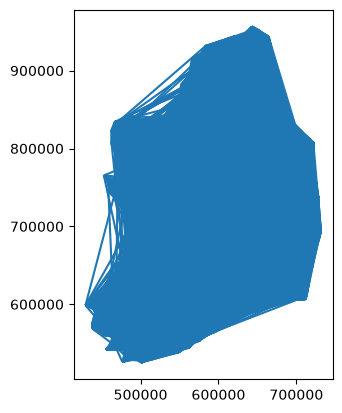

In [13]:
powscar_ed_2022.plot()

OK so that worked, but obviously this is not a particularly useful plot. However, we can isolate parts of the dataset in order to make plots which would be much more useful. For example, the University of Limerick is in the Ballysimon ED - and we can extract all rows where the POWSC ED is Ballysimon to see who's travelling to that ED:

In [16]:
powscar_ballysimon_ed_2022 = powscar_ed_2022[powscar_ed_2022['POWSCC_CSOED_LABEL'] == 'BALLYSIMON']
powscar_ballysimon_ed_2022

,RESIDENCE_CSOED_GUID,RESIDENCE_CSOED_LABEL,RESIDENCE_COUNTY,RESIDENCE_COUNTY_LABEL,POWSCC_CSOED_GUID,POWSCC_CSOED_LABEL,POWSCC_COUNTY,POWSCC_COUNTY_LABEL,COUNT,residence_centroid,powsc_centroid,geometry
287312,23519126-bd85-4c40-a1e2-26c5d2b7e51c,ARIGNA/DRUMKEERAN/KILLARGA,LM,Leitrim,2ae19629-1770-13a3-e055-000000000001,BALLYSIMON,LK,Limerick City and County,1,POINT (591104.381 826712.302),POINT (562146.841 653973.897),"LINESTRING (591104.381 826712.302, 562146.841 ..."
287313,2ae19629-16a1-13a3-e055-000000000001,BALLYADAMS,LS,Laois,2ae19629-1770-13a3-e055-000000000001,BALLYSIMON,LK,Limerick City and County,1,POINT (661590.788 692460.834),POINT (562146.841 653973.897),"LINESTRING (661590.788 692460.834, 562146.841 ..."
287314,2ae19629-16a2-13a3-e055-000000000001,BALLYBRITTAS,LS,Laois,2ae19629-1770-13a3-e055-000000000001,BALLYSIMON,LK,Limerick City and County,3,POINT (655700.77 707996.988),POINT (562146.841 653973.897),"LINESTRING (655700.77 707996.988, 562146.841 6..."
287315,2ae19629-16a3-13a3-e055-000000000001,BALLYBROPHY,LS,Laois,2ae19629-1770-13a3-e055-000000000001,BALLYSIMON,LK,Limerick City and County,3,POINT (625534.846 682936.34),POINT (562146.841 653973.897),"LINESTRING (625534.846 682936.34, 562146.841 6..."
287316,2ae19629-16a4-13a3-e055-000000000001,BALLYCARROLL,LS,Laois,2ae19629-1770-13a3-e055-000000000001,BALLYSIMON,LK,Limerick City and County,2,POINT (652739.073 699686.482),POINT (562146.841 653973.897),"LINESTRING (652739.073 699686.482, 562146.841 ..."
...,...,...,...,...,...,...,...,...,...,...,...,...
289497,dbab8c3d-d659-4fa5-ad92-f90a6bf64249,BALLYEIGHTER/GLENROE,CE,Clare,2ae19629-1770-13a3-e055-000000000001,BALLYSIMON,LK,Limerick City and County,6,POINT (532063.083 695055.406),POINT (562146.841 653973.897),"LINESTRING (532063.083 695055.406, 562146.841 ..."
289498,ee73a85e-7ac6-4aa6-82d2-09c321be7258,MOVEEN/TULLIG,CE,Clare,2ae19629-1770-13a3-e055-000000000001,BALLYSIMON,LK,Limerick City and County,1,POINT (482503.286 654922.823),POINT (562146.841 653973.897),"LINESTRING (482503.286 654922.823, 562146.841 ..."
289499,f0b72184-af6a-4a08-9f38-8033428dfcf7,DUNDALK RURAL (NORTH),LH,Louth,2ae19629-1770-13a3-e055-000000000001,BALLYSIMON,LK,Limerick City and County,1,POINT (704500.051 809301.524),POINT (562146.841 653973.897),"LINESTRING (704500.051 809301.524, 562146.841 ..."
289500,f26b950c-de46-4c46-b4be-21b2c886958f,DUNDALK RURAL (SOUTH),LH,Louth,2ae19629-1770-13a3-e055-000000000001,BALLYSIMON,LK,Limerick City and County,4,POINT (706046.471 805702.759),POINT (562146.841 653973.897),"LINESTRING (706046.471 805702.759, 562146.841 ..."


<Axes: >

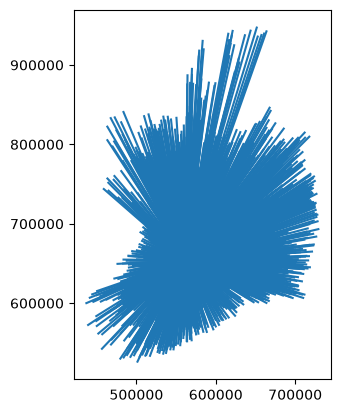

In [17]:
powscar_ballysimon_ed_2022.plot()

OK, let's make this look better - which, by the way, I'm sure you're realising is a large part of doing GIS mapping.

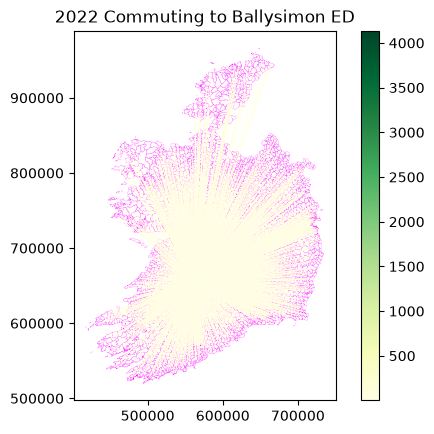

In [19]:
fig, ax = plt.subplots()
ax.set_title('2022 Commuting to Ballysimon ED')
ed_2022.boundary.plot(ax=ax, color='fuchsia', linewidth=0.1)
powscar_ballysimon_ed_2022.plot(column='COUNT', ax=ax, linewidth=0.5, cmap="YlGn", legend=True)
plt.show()

Not much variation in the colours, but we can try to make the scale more useful by making it logarithmic:

In [20]:
powscar_ballysimon_ed_2022['log_count'] = np.log(powscar_ballysimon_ed_2022['COUNT'])
max_count = powscar_ballysimon_ed_2022['COUNT'].max()
min_count = powscar_ballysimon_ed_2022['COUNT'].min()
powscar_ballysimon_ed_2022.head()

,RESIDENCE_CSOED_GUID,RESIDENCE_CSOED_LABEL,RESIDENCE_COUNTY,RESIDENCE_COUNTY_LABEL,POWSCC_CSOED_GUID,POWSCC_CSOED_LABEL,POWSCC_COUNTY,POWSCC_COUNTY_LABEL,COUNT,residence_centroid,powsc_centroid,geometry,log_count
287312,23519126-bd85-4c40-a1e2-26c5d2b7e51c,ARIGNA/DRUMKEERAN/KILLARGA,LM,Leitrim,2ae19629-1770-13a3-e055-000000000001,BALLYSIMON,LK,Limerick City and County,1,POINT (591104.381 826712.302),POINT (562146.841 653973.897),"LINESTRING (591104.381 826712.302, 562146.841 ...",0.000000
287313,2ae19629-16a1-13a3-e055-000000000001,BALLYADAMS,LS,Laois,2ae19629-1770-13a3-e055-000000000001,BALLYSIMON,LK,Limerick City and County,1,POINT (661590.788 692460.834),POINT (562146.841 653973.897),"LINESTRING (661590.788 692460.834, 562146.841 ...",0.000000
287314,2ae19629-16a2-13a3-e055-000000000001,BALLYBRITTAS,LS,Laois,2ae19629-1770-13a3-e055-000000000001,BALLYSIMON,LK,Limerick City and County,3,POINT (655700.77 707996.988),POINT (562146.841 653973.897),"LINESTRING (655700.77 707996.988, 562146.841 6...",1.098612
287315,2ae19629-16a3-13a3-e055-000000000001,BALLYBROPHY,LS,Laois,2ae19629-1770-13a3-e055-000000000001,BALLYSIMON,LK,Limerick City and County,3,POINT (625534.846 682936.34),POINT (562146.841 653973.897),"LINESTRING (625534.846 682936.34, 562146.841 6...",1.098612
287316,2ae19629-16a4-13a3-e055-000000000001,BALLYCARROLL,LS,Laois,2ae19629-1770-13a3-e055-000000000001,BALLYSIMON,LK,Limerick City and County,2,POINT (652739.073 699686.482),POINT (562146.841 653973.897),"LINESTRING (652739.073 699686.482, 562146.841 ...",0.693147


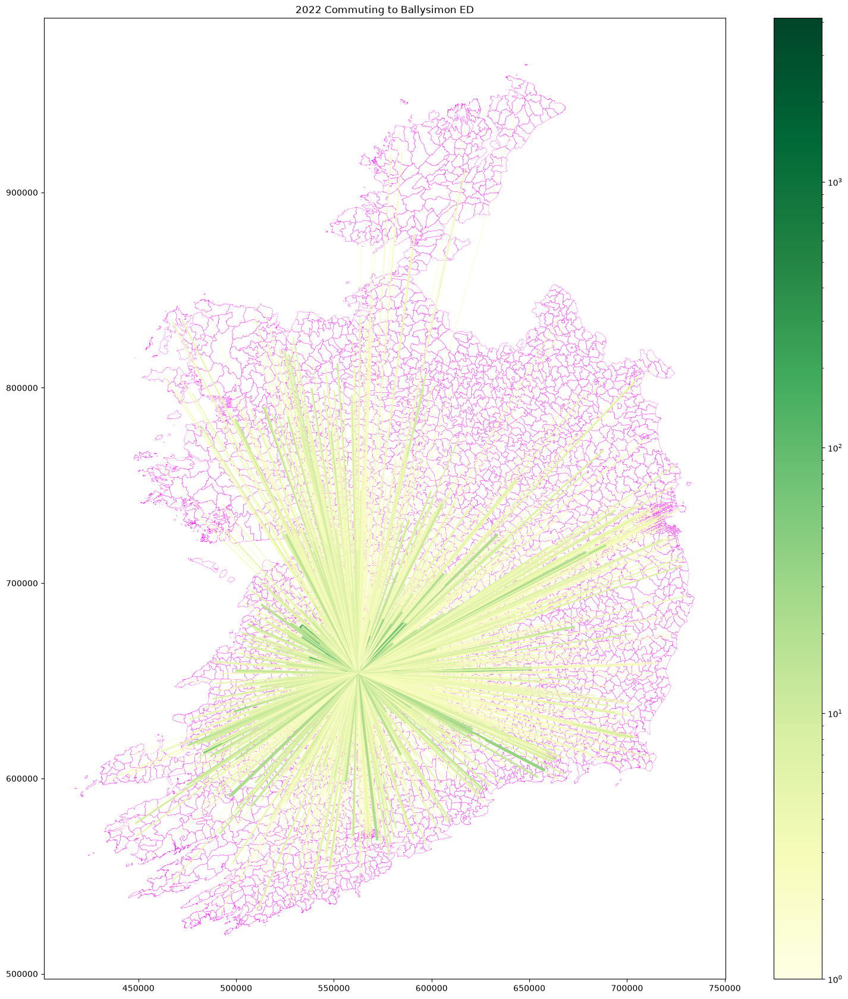

In [21]:
fig, ax = plt.subplots(figsize=(21,21))
ax.set_title('2022 Commuting to Ballysimon ED')
ed_2022.boundary.plot(ax=ax, color='fuchsia', linewidth=0.2)
powscar_ballysimon_ed_2022.plot(column='COUNT', ax=ax, linewidth=powscar_ballysimon_ed_2022['log_count'], norm=colors.LogNorm(vmin=min_count, vmax=max_count), cmap="YlGn", legend=True)
plt.show()

I'm sure we could make this prettier, but I'll stop there for now. Just for comparison, the Ballycummin ED on the other side of Limerick:

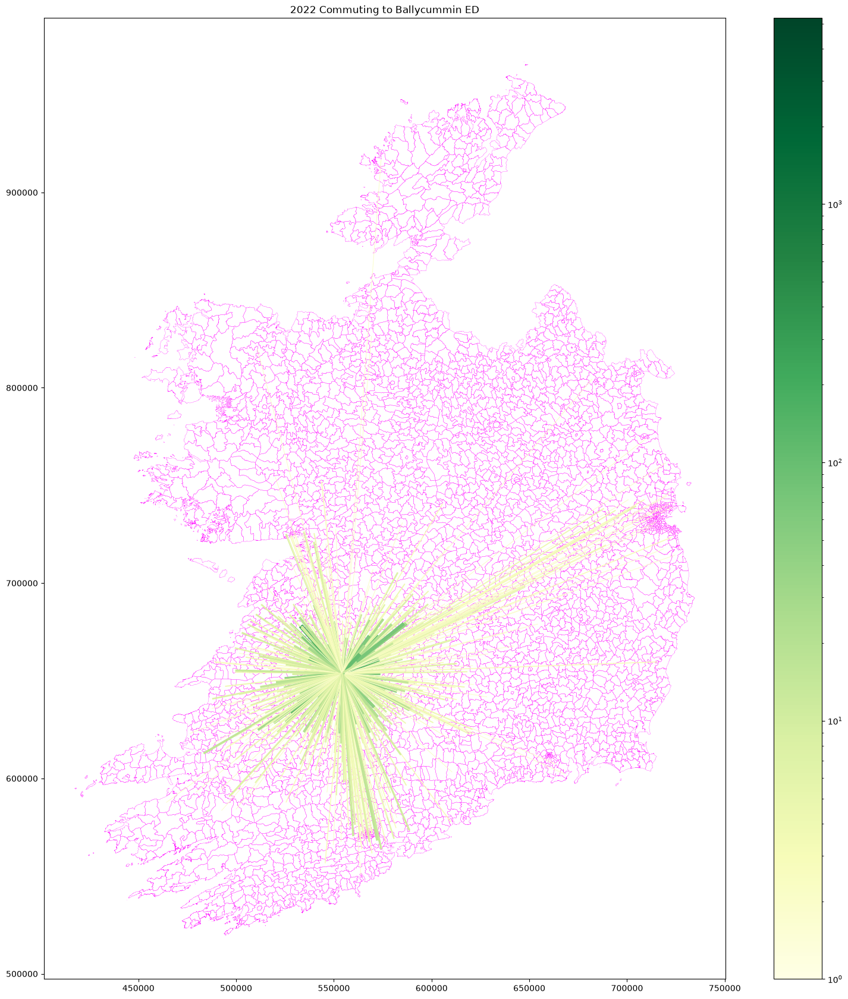

In [22]:
powscar_ballycummin_ed_2022 = powscar_ed_2022[powscar_ed_2022['POWSCC_CSOED_LABEL'] == 'BALLYCUMMIN']
powscar_ballycummin_ed_2022['log_count'] = np.log(powscar_ballycummin_ed_2022['COUNT'])
max_count_ballycummin = powscar_ballycummin_ed_2022['COUNT'].max()
min_count_ballycummin = powscar_ballycummin_ed_2022['COUNT'].min()

fig, ax = plt.subplots(figsize=(21,21))
ax.set_title('2022 Commuting to Ballycummin ED')
ed_2022.boundary.plot(ax=ax, color='fuchsia', linewidth=0.2)
powscar_ballycummin_ed_2022.plot(column='COUNT', ax=ax, linewidth=powscar_ballycummin_ed_2022['log_count'], norm=colors.LogNorm(vmin=min_count_ballycummin, vmax=max_count_ballycummin), cmap="YlGn", legend=True)
plt.show()

That's still an unhealthy amount of commuting, but it really looks like the Ballysimon map is showing students commuting from their home address to UL - and some are, due to the housing crisis, but it's also likely that the data isn't really reflecting reality, with many students listed at a home address rather than an actual term time address. Another note of caution - it doesn't make the data unusable, but you do need to think about what the data might be showing.

In any case, the point here is that you can use vector Line features to show movement from one place to another, whether using POWSCAR data from the Census, or any other source of similar data, including workplace employee data, or even custom surveys.

On top of that, you could plot train lines, bus routes, roads, towns and cities - any relevant transport and population data. 

## 2. Actual movement data

The above example is showing aggregate or theoretical movement, but it's not showing the *actual* movement of individual people or vehicles.

Just as in the example above, you can show actual movement as a Line feature, where the points along the line are locations along the path of movement.

However, it's also possible to go deeper, with data consisting of a series of Points - each with a timestamp recording *when* the person or object was at that point. 

Let's use an example of a bus journey, tracked using a mobile phone GPS with the app Strava - normally used to track exercise, so bear in mind that you can repeat this kind of analysis for examples like bike trips or runs. Data from Strava - and other common GPS tracking apps - can be downloaded as a GPX file, a standard format for movement data, which records locations and timestamps.

In [23]:
gpx = gpd.read_file('https://github.com/bamacgabhann/GY5021/raw/2024/GY5021/3_Spatial_and_Temporal_Change/sample_data/bus/304_to_UL_2019-02-18_0745.gpx', layer="track_points").set_index("time")

# Since GPX is a standardised format, it has a lot of unnecessary columns which aren't always used. So we can drop the unused columns here

gpx.drop(
    columns=[
        "magvar",
        "geoidheight",
        "name",
        "cmt",
        "desc",
        "src",
        "link1_href",
        "link1_text",
        "link1_type",
        "link2_href",
        "link2_text",
        "link2_type",
        "sym",
        "type",
        "fix",
        "sat",
        "hdop",
        "vdop",
        "pdop",
        "ageofdgpsdata",
        "dgpsid",
    ],
    inplace=True,
)
gpx = gpx.to_crs(2157) # reproject to EPSG:2157 - Irish Transverse Mercator (ITM)
gpx.head()

,track_fid,track_seg_id,track_seg_point_id,ele,geometry
time,,,,,
2019-02-18 07:45:50+00:00,0,0,0,19.5,POINT (555200.802 653308.459)
2019-02-18 07:45:52+00:00,0,0,1,19.5,POINT (555202.31 653303.105)
2019-02-18 07:45:54+00:00,0,0,2,19.6,POINT (555198.741 653305.252)
2019-02-18 07:45:55+00:00,0,0,3,19.6,POINT (555196.341 653309.279)
2019-02-18 07:45:56+00:00,0,0,4,19.6,POINT (555197.798 653313.16)


So here we can see the data has timestamps, and a Point location for each time. Let's plot this:

<Axes: >

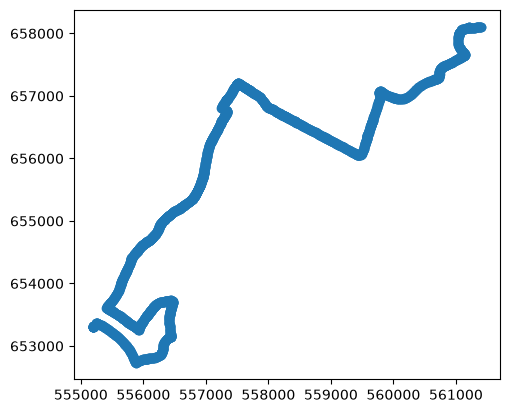

In [24]:
gpx.plot()

Okay, that's nice to see, but not very useful by itself, so, let's use OSMNX to grab some roads and buildings for the area:

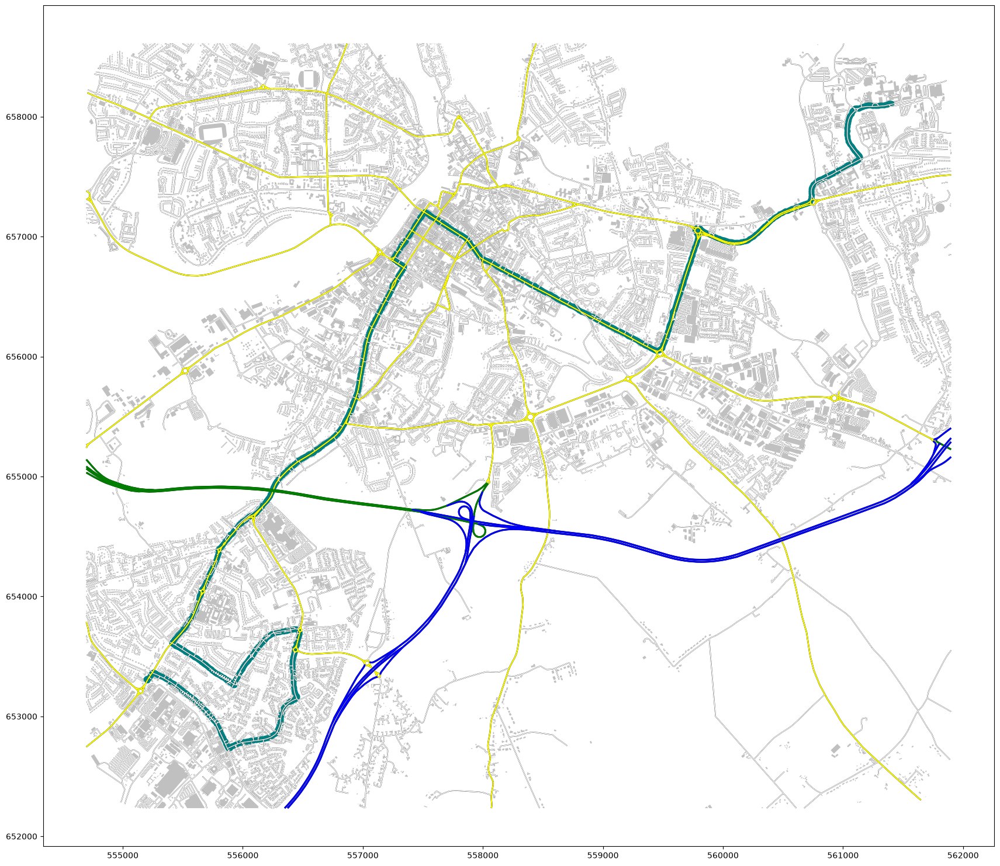

In [25]:
# create a box containing the route, expanded by 500m, and a WGS84 polygon of this to use for extracting OSM data
overlay_bounds = gpd.GeoDataFrame({"id":1,"geometry":[box(*gpx.total_bounds)]}).set_crs(2157)
overlay_bounds['geometry'] = overlay_bounds['geometry'].buffer(500)
route_bounds = overlay_bounds.to_crs(4326).geometry[0]

# download the buildings
tags = {"building": True}
lk_buildings = ox.features_from_polygon(route_bounds, tags)
lk_buildings = lk_buildings[lk_buildings.geom_type == 'Polygon'].to_crs(2157).overlay(overlay_bounds, how='intersection')

# download the motorway, national, secondary, and local roads from OpenStreetMap in the area, cropping them to the map area
LK_M_roads = ox.features_from_polygon(route_bounds, tags={'highway': ['motorway_link', 'motorway']}).to_crs(2157).overlay(overlay_bounds, how='intersection')
LK_N_roads = ox.features_from_polygon(route_bounds, tags={'highway': ['trunk','trunk_link','primary','primary_link']}).to_crs(2157).overlay(overlay_bounds, how='intersection')
LK_R_roads = ox.features_from_polygon(route_bounds, tags={'highway': ['secondary','secondary_link']}).to_crs(2157).overlay(overlay_bounds, how='intersection')
LK_L_roads = ox.features_from_polygon(route_bounds, tags={'highway': ['tertiary','unclassified','residential','service', 'tertiary_link']}).to_crs(2157).overlay(overlay_bounds, how='intersection')

# plot
fig, ax = plt.subplots(figsize=(21, 21))

# plot all roads with a thicker black line which will show as edges,
# and a main line coloured by category
LK_L_roads.plot(ax=ax, color='black', linewidth=1.2)
LK_R_roads.plot(ax=ax, color='black', linewidth=1.7)
LK_N_roads.plot(ax=ax, color='black', linewidth=2.2)
LK_M_roads.plot(ax=ax, color='black', linewidth=2.2)
LK_L_roads.plot(ax=ax, color='white', linewidth=1)
LK_R_roads.plot(ax=ax, color='yellow', linewidth=1.5)
LK_N_roads.plot(ax=ax, color='green', linewidth=2)
LK_M_roads.plot(ax=ax, color='Blue', linewidth=2)

# plot the buildings
lk_buildings.plot(ax=ax, color='silver')

# plot the bus journey
gpx.plot(ax=ax, color='teal')

plt.show()

This is much nicer, but it's still just treating the bus journey as a line, it's not doing anything with the time data which makes it movement data. 

We can use the ```movingpandas``` package to do this.

In [26]:
track = mpd.Trajectory(gpx, 1)
track.add_speed(name="speed (km/h)", units=("km", "h"))
track.add_distance(units="m")

track.df

,track_fid,track_seg_id,track_seg_point_id,ele,geometry,traj_id,speed (km/h),distance
time,,,,,,,,
2019-02-18 07:45:50,0,0,0,19.5,POINT (555200.802 653308.459),1,10.013299,0.000000
2019-02-18 07:45:52,0,0,1,19.5,POINT (555202.31 653303.105),1,10.013299,5.562944
2019-02-18 07:45:54,0,0,2,19.6,POINT (555198.741 653305.252),1,7.496215,4.164564
2019-02-18 07:45:55,0,0,3,19.6,POINT (555196.341 653309.279),1,16.879172,4.688659
2019-02-18 07:45:56,0,0,4,19.6,POINT (555197.798 653313.16),1,14.924081,4.145578
...,...,...,...,...,...,...,...,...
2019-02-18 09:00:22,0,0,2139,16.2,POINT (561378.487 658107.159),1,18.522983,5.145273
2019-02-18 09:00:23,0,0,2140,16.3,POINT (561383.981 658109.118),1,20.998269,5.832852
2019-02-18 09:00:24,0,0,2141,16.3,POINT (561389.932 658108.96),1,21.429807,5.952724


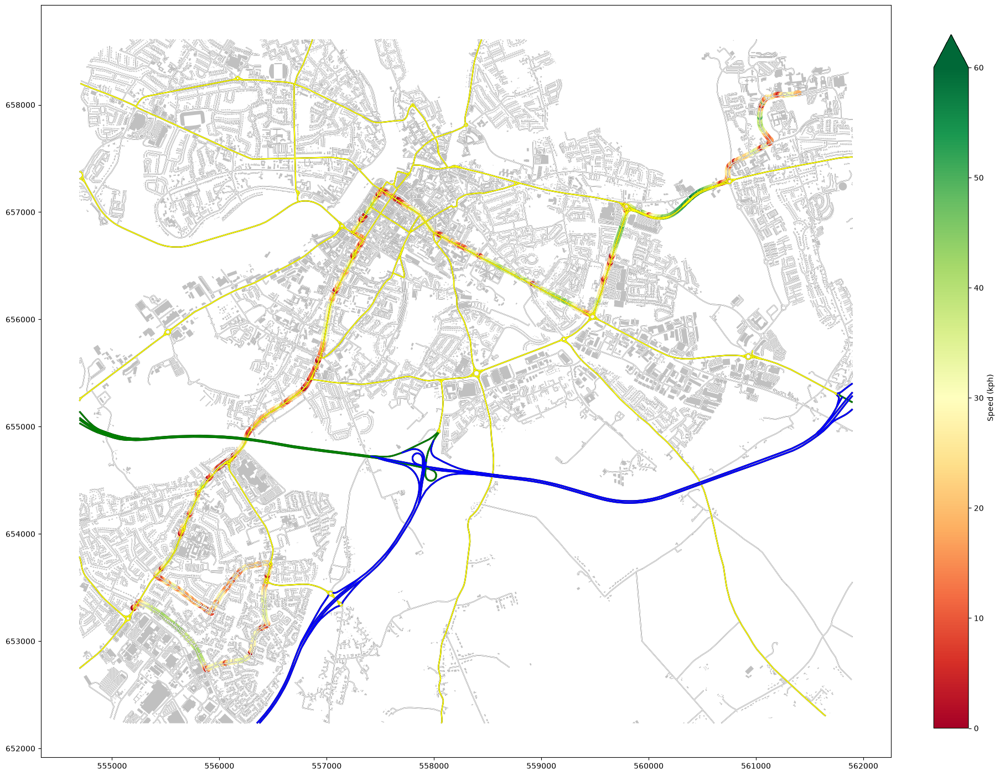

In [27]:
# plot
fig, ax = plt.subplots(figsize=(18, 18), layout='constrained')

# plot all roads with a thicker black line which will show as edges,
# and a main line coloured by category
LK_L_roads.plot(ax=ax, color='black', linewidth=1.2)
LK_R_roads.plot(ax=ax, color='black', linewidth=1.7)
LK_N_roads.plot(ax=ax, color='black', linewidth=2.2)
LK_M_roads.plot(ax=ax, color='black', linewidth=2.2)
LK_L_roads.plot(ax=ax, color='white', linewidth=1)
LK_R_roads.plot(ax=ax, color='yellow', linewidth=1.5)
LK_N_roads.plot(ax=ax, color='green', linewidth=2)
LK_M_roads.plot(ax=ax, color='Blue', linewidth=2)

# plot the buildings
lk_buildings.plot(ax=ax, color='silver')

# plot the bus journey
track.df.plot(ax=ax, column='speed (km/h)', cmap='RdYlGn', vmin=0, vmax=60)

# colourbar
sm = plt.cm.ScalarMappable(cmap='RdYlGn', norm=plt.Normalize(vmin=0, vmax=60))
cb = plt.colorbar(sm, ax=ax, extend='max', label="Speed (kph)", shrink=0.7)
cb.set_ticks([0, 10, 20, 30, 40, 50, 60])

plt.show()

Nice - we can now see where the bus was moving fast or slow, which can hopefully allow analysis of potential changes to infrastructure etc. to help improve the system.

This is the kind of thing that ```movingpandas``` allows - it simply adds a lot of functions to handle movement data. But it's more than just adding columns for speed - it can also identify where movement stopped:

In [28]:
# identify locations where the bus remained within a circle diameter 30m for more than 15 seconds

detector = mpd.TrajectoryStopDetector(track)
stationary_points = detector.get_stop_points(
    min_duration=timedelta(seconds=15), 
    max_diameter=30
)

In [29]:
bus_stops = gpd.read_file('https://github.com/bamacgabhann/GY5021/raw/2024/GY5021/3_Spatial_and_Temporal_Change/sample_data/bus/stops_304_to_ul.gpkg').to_crs(2157)

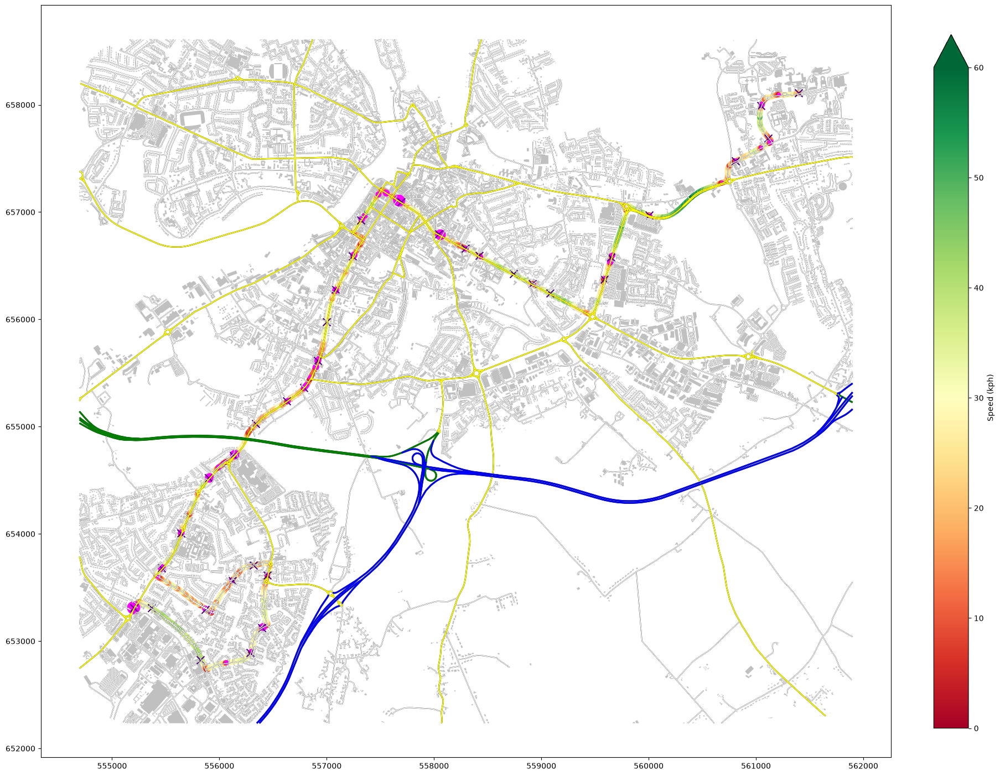

In [30]:
# plot
fig, ax = plt.subplots(figsize=(18, 18), layout='constrained')

# plot all roads with a thicker black line which will show as edges,
# and a main line coloured by category
LK_L_roads.plot(ax=ax, color='black', linewidth=1.2)
LK_R_roads.plot(ax=ax, color='black', linewidth=1.7)
LK_N_roads.plot(ax=ax, color='black', linewidth=2.2)
LK_M_roads.plot(ax=ax, color='black', linewidth=2.2)
LK_L_roads.plot(ax=ax, color='white', linewidth=1)
LK_R_roads.plot(ax=ax, color='yellow', linewidth=1.5)
LK_N_roads.plot(ax=ax, color='green', linewidth=2)
LK_M_roads.plot(ax=ax, color='Blue', linewidth=2)

# plot the buildings
lk_buildings.plot(ax=ax, color='silver')

# plot the bus journey
track.df.plot(ax=ax, column='speed (km/h)', cmap='RdYlGn', vmin=0, vmax=60)

# plot the stationary points
stationary_points.plot(ax=ax, marker='o', color='fuchsia', markersize=stationary_points['duration_s'])

# plot the bus stops
bus_stops.plot(ax=ax, marker='x', color='indigo', markersize=100, zorder=1)

# colourbar
sm = plt.cm.ScalarMappable(cmap='RdYlGn', norm=plt.Normalize(vmin=0, vmax=60))
cb = plt.colorbar(sm, ax=ax, extend='max', label="Speed (kph)", shrink=0.7)
cb.set_ticks([0, 10, 20, 30, 40, 50, 60])

plt.show()

We can do more than just map this, as well - we can look at *how long* the bus was stopped for.

In [31]:
stationary_points[1:]

,geometry,start_time,end_time,traj_id,duration_s
stop_id,,,,,
1_2019-02-18 07:52:30,POINT (556067.084 652799.107),2019-02-18 07:52:30,2019-02-18 07:52:59,1,29.0
1_2019-02-18 07:53:37,POINT (556297.779 652905.632),2019-02-18 07:53:37,2019-02-18 07:54:06,1,29.0
1_2019-02-18 07:54:42,POINT (556405.242 653130.375),2019-02-18 07:54:42,2019-02-18 07:56:07,1,85.0
1_2019-02-18 07:57:30,POINT (556447.906 653620.734),2019-02-18 07:57:30,2019-02-18 07:58:02,1,32.0
1_2019-02-18 07:59:26,POINT (556115.458 653565.731),2019-02-18 07:59:26,2019-02-18 07:59:56,1,30.0
1_2019-02-18 08:00:52,POINT (555925.831 653269.415),2019-02-18 08:00:52,2019-02-18 08:01:09,1,17.0
1_2019-02-18 08:01:17,POINT (555867.568 653303.608),2019-02-18 08:01:17,2019-02-18 08:02:02,1,45.0
1_2019-02-18 08:03:32,POINT (555429.141 653598.611),2019-02-18 08:03:32,2019-02-18 08:03:50,1,18.0
1_2019-02-18 08:04:02,POINT (555463.299 653680.58),2019-02-18 08:04:02,2019-02-18 08:05:31,1,89.0


And we can add up the stationary periods:

In [32]:
stationary_points[1:]['duration_s'].sum()

np.float64(2222.0)

That's in seconds. In minutes:

In [33]:
stationary_points[1:]['duration_s'].sum()/60

np.float64(37.03333333333333)

Just to make that clear - in a bus journey which lasted 1h15min, that's 75 minutes, it spent THIRTY SEVEN minutes stationary. That's HALF the journey time. 

This is part of a research dataset I'm working on, trying to improve the bus system in Limerick, and I'm about to move on to bus services in other places too. 

Obviously, movingpandas can be used for much more than just bus journeys - the main author, Anite Graser, initially wrote it to analyse shipping data. There's some great tutorials which you can find <a href='https://github.com/movingpandas/movingpandas?tab=readme-ov-file'>on the GitHub page</a>.

## Summary

Movement can be shown by Line features - with a line going from the start point to the end point.

For even more detail, movement can be shown by a series of Point features, where each Point has a timestamp. 

Data of this kind can reveal some very powerful insights, and it's a lot of fun to work with. It's also data you can easily collect yourself, using apps like Strava - and movement data for ships and aircraft is also available from AIS and ADSB transponder data. Hopefully this has given you some ideas!